<center>
  <h1 style="background-color:white; color:blue; font-size:50px; font-weight:bold; font-family:Times New Roman; border:2px solid black;"> Data Science Internship by CodSoft </h1>
</center>

# Task_2: MOVIE RATING PREDICTION

# <font color="purple"><b>Import Library</b></font>

In [1]:
import pandas as pd
import numpy as np

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from itertools import combinations
import missingno


# modeling
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import accuracy_score
from sklearn import metrics


# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# <font color="purple"><b>Load the IMDb Movies India dataset</b></font>

In [2]:
# Read the CSV file
d= pd.read_csv(r"D:\Sushil Gupta\Internship\CodSoft\Project\Task 02 Movie Prediction\IMDb Movies India.csv", encoding='ISO-8859-1')

# <font color="purple"><b>Explore the dataset</b></font>

In [3]:
d.head(5)

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),(2019),109 min,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,(2021),90 min,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,(2019),110 min,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,(2010),105 min,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali


In [4]:
# Display information about the DataFrame
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15509 entries, 0 to 15508
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Name      15509 non-null  object 
 1   Year      14981 non-null  object 
 2   Duration  7240 non-null   object 
 3   Genre     13632 non-null  object 
 4   Rating    7919 non-null   float64
 5   Votes     7920 non-null   object 
 6   Director  14984 non-null  object 
 7   Actor 1   13892 non-null  object 
 8   Actor 2   13125 non-null  object 
 9   Actor 3   12365 non-null  object 
dtypes: float64(1), object(9)
memory usage: 1.2+ MB


In [5]:
# Display descriptive statistics of all columns, including categorical ones
d.describe(include='all')

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
count,15509,14981,7240,13632,7919.000000,7920,14984,13892,13125,12365
unique,13838,102,182,485,NaN,2034,5938,4718,4891,4820
top,Anjaam,(2019),120 min,Drama,NaN,8,Jayant Desai,Ashok Kumar,Rekha,Pran
freq,7,410,240,2780,NaN,227,58,158,83,91
mean,NaN,NaN,NaN,NaN,5.841621,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,1.381777,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,1.100000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,4.900000,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,6.000000,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,6.800000,NaN,NaN,NaN,NaN,NaN


In [6]:
print("India Movie Data Shape  :" ,d.shape)

India Movie Data Shape  : (15509, 10)


In [7]:
d.groupby(['Genre']).count()

,Name,Year,Duration,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
Genre,,,,,,,,,
Action,1289,1265,262,417,417,1249,1207,1124,1005
"Action, Adventure",41,41,17,24,24,41,40,39,39
"Action, Adventure, Biography",1,1,1,1,1,1,1,1,1
"Action, Adventure, Comedy",42,41,37,40,40,42,42,42,42
"Action, Adventure, Crime",19,19,11,16,16,19,19,19,19
...,...,...,...,...,...,...,...,...,...
"Thriller, Action",2,2,1,1,1,2,2,2,2
"Thriller, Musical, Mystery",1,1,1,1,1,1,1,1,1
"Thriller, Mystery",3,3,2,3,3,3,3,3,3


In [8]:
d[(d[ 'Rating' ] == d[ 'Rating' ].max())]

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
8339,Love Qubool Hai,(2020),94 min,"Drama, Romance",10.0,5,Saif Ali Sayeed,Ahaan Jha,Mahesh Narayan,Rajasree Rajakumari


In [9]:
d[(d[ 'Rating' ] == d[ 'Rating' ].min())]

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
12171,Sadak 2,(2020),133 min,"Action, Drama",1.1,"67,785",Mahesh Bhatt,Alia Bhatt,Priyanka Bose,Sanjay Dutt


In [10]:
d.Rating.nunique()

84

In [11]:
d.Rating.unique() 

array([ nan,  7. ,  4.4,  4.7,  7.4,  5.6,  4. ,  6.2,  5.9,  6.5,  5.7,
        6.3,  7.2,  6.6,  7.3,  7.1,  6.9,  3.5,  5. ,  4.5,  6.4,  4.1,
        4.8,  8.1,  5.5,  6.8,  6.1,  7.7,  5.1,  7.6,  3.1,  3.3,  7.8,
        8.4,  5.2,  4.3,  5.8,  4.6,  7.5,  6.7,  3.6,  3.9,  5.4,  4.2,
        5.3,  3.4,  3. ,  8. ,  6. ,  3.8,  7.9,  2.7,  4.9,  2.4,  3.7,
        3.2,  2.5,  2.8,  2.6,  2.9,  8.2,  8.7,  8.3,  9.3,  8.8,  2.1,
        2.3,  8.5,  8.6,  9. ,  9.6,  1.7,  9.1,  2. ,  1.4,  8.9,  1.9,
        9.4,  9.7,  1.8,  9.2,  1.6, 10. ,  2.2,  1.1])

In [12]:
d[d['Rating'] <= 5].groupby('Rating').count()

,Name,Year,Duration,Genre,Votes,Director,Actor 1,Actor 2,Actor 3
Rating,,,,,,,,,
1.1,1,1,1,1,1,1,1,1,1
1.4,1,1,1,1,1,1,1,1,1
1.6,3,3,2,3,3,3,3,3,3
1.7,5,5,5,5,5,5,5,5,5
1.8,4,4,4,4,4,4,4,4,4
1.9,6,6,5,6,6,6,6,6,6
2.0,4,4,3,4,4,4,4,4,3
2.1,8,8,6,8,8,8,8,8,8
2.2,5,5,4,5,5,5,5,5,5


In [13]:
d[d['Rating'] >= 5].groupby('Rating').count()

,Name,Year,Duration,Genre,Votes,Director,Actor 1,Actor 2,Actor 3
Rating,,,,,,,,,
5.0,151,151,100,149,151,151,151,151,151
5.1,166,166,120,165,166,166,166,166,166
5.2,141,141,102,138,141,141,139,138,137
5.3,171,171,130,170,171,171,171,170,168
5.4,208,208,145,205,208,208,205,205,204
5.5,167,167,116,167,167,167,167,165,163
5.6,196,196,143,196,196,196,195,195,193
5.7,200,200,148,197,200,200,200,200,198
5.8,207,207,145,204,207,207,204,202,201


In [14]:
d['Director'].nunique()

5938

In [15]:
d["Director"].value_counts().head(6)

Director
Jayant Desai       58
Kanti Shah         57
Babubhai Mistry    50
Mahesh Bhatt       48
Master Bhagwan     47
Nanabhai Bhatt     46
Name: count, dtype: int64

In [16]:
d['Votes'].nunique()

2034

In [17]:
# Display the count of missing values for each column
d.isna().sum()

Name           0
Year         528
Duration    8269
Genre       1877
Rating      7590
Votes       7589
Director     525
Actor 1     1617
Actor 2     2384
Actor 3     3144
dtype: int64

In [18]:
# # Drop rows with missing values (NaN) from the DataFrame inplace
# d.dropna(inplace=True)
# d.head(10)

# <font color="purple"><b>Data Visualization</b></font>

In [19]:
# Convert the 'Year' column to string type
d['Year'] = d['Year'].astype(str)

# Extract numeric part of the string
d['Year'] = d['Year'].str.extract('(\d+)')

# Convert to numeric, handling non-finite values
d['Year'] = pd.to_numeric(d['Year'], errors='coerce')

# Replace non-finite values (NaN, inf) with a default value
default_year = 1900  

# Replace with your desired default year
d['Year'] = d['Year'].replace([np.nan, np.inf, -np.inf], default_year)

# Convert to integers
d['Year'] = d['Year'].astype(int)

In [20]:
# Extract numeric values from the 'Duration' column using regular expression
d['Duration'] = d['Duration'].str.extract('(\d+)')

# Convert the extracted values to numeric format, handle errors by coercing non-numeric values to NaN
d['Duration'] = pd.to_numeric(d['Duration'], errors='coerce')

In [21]:
# Cross-Check for changes 
d[['Year', 'Duration']].head(5)

,Year,Duration
0,1900,NaN
1,2019,109.0
2,2021,90.0
3,2019,110.0
4,2010,105.0


In [22]:
# Convert str to int
d["Votes"]=d["Votes"].replace("$5.16M", 516)

# Convert to whole column to numeric and remove the comma
d["Votes"] = pd.to_numeric(d['Votes'].str.replace(',',''))

In [23]:
d.dtypes

Name         object
Year          int32
Duration    float64
Genre        object
Rating      float64
Votes       float64
Director     object
Actor 1      object
Actor 2      object
Actor 3      object
dtype: object

In [24]:
d['Name']

0                                          
1        #Gadhvi (He thought he was Gandhi)
2                               #Homecoming
3                                   #Yaaram
4                         ...And Once Again
                        ...                
15504                   Zulm Ko Jala Doonga
15505                                 Zulmi
15506                             Zulmi Raj
15507                         Zulmi Shikari
15508                          Zulm-O-Sitam
Name: Name, Length: 15509, dtype: object

In [25]:
# extract alphabetical characters, spaces, single quotes, and hyphens
# [A-Za-z]: Matches uppercase and lowercase letters.
# \s: Matches any whitespace character.
# \': Matches a single quote.
# \-: Matches a hyphen.
    
d['Name'] = d['Name'].str.extract('([A-Za-z\s\'\-]+)')

In [26]:
d['Name']

0                           
1                    Gadhvi 
2                 Homecoming
3                     Yaaram
4             And Once Again
                ...         
15504    Zulm Ko Jala Doonga
15505                  Zulmi
15506              Zulmi Raj
15507          Zulmi Shikari
15508           Zulm-O-Sitam
Name: Name, Length: 15509, dtype: object

In [27]:
# Concatenating the Actors series into one series
Actor1 = d['Actor 1']
Actor2 = d['Actor 2']
Actor3 = d['Actor 3']

Actors = pd.concat([Actor1, Actor2, Actor3])
Actors.head(10)

0           Manmauji
1       Rasika Dugal
2       Sayani Gupta
3            Prateik
4       Rajat Kapoor
5         Bobby Deol
6    Jimmy Sheirgill
7                NaN
8          Yash Dave
9          Augustine
dtype: object

In [28]:
def Histogram(column):
    global d
    # Create a histogram using plotly.graph_objects
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=d[column], marker_color='skyblue', marker_line_color='blue', marker_line_width=1.5))

    fig.update_layout(title=f'Histogram of {column}',
                      xaxis_title=column,
                      yaxis_title='Frequency',
                      template='plotly_dark')

    fig.show()

In [29]:
Histogram('Rating')

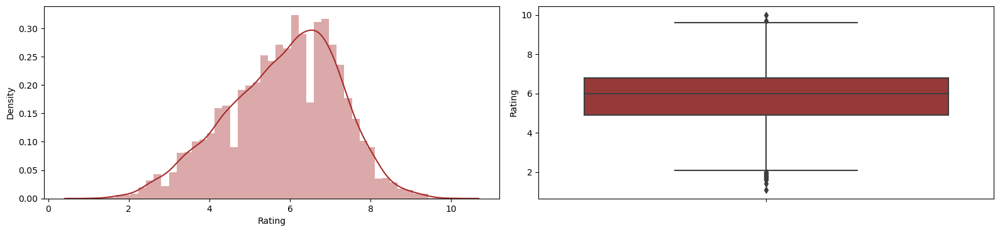

In [30]:
plt.figure(figsize=(16,7))

plt.subplot(2,2,1)
sns.distplot(d['Rating'],color='brown')

plt.subplot(2,2,2)
sns.boxplot(y=d['Rating'],color='brown')

plt.tight_layout()
plt.show()

In [31]:
Histogram('Year')

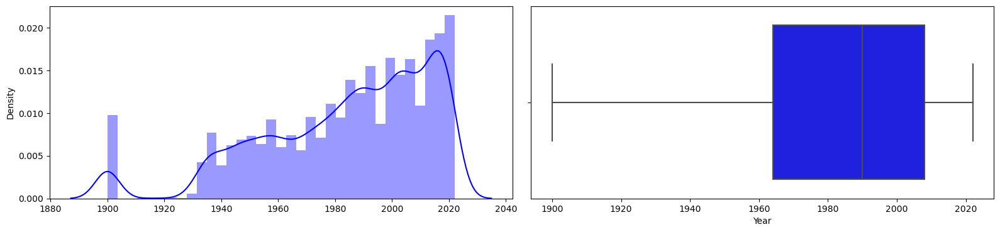

In [32]:
plt.figure(figsize=(16,7))

plt.subplot(2,2,1)
sns.distplot(x=d['Year'],color='blue')

plt.subplot(2,2,2)
sns.boxplot(x=d['Year'],color='blue')

plt.tight_layout()
plt.show()

In [33]:
Histogram('Duration')

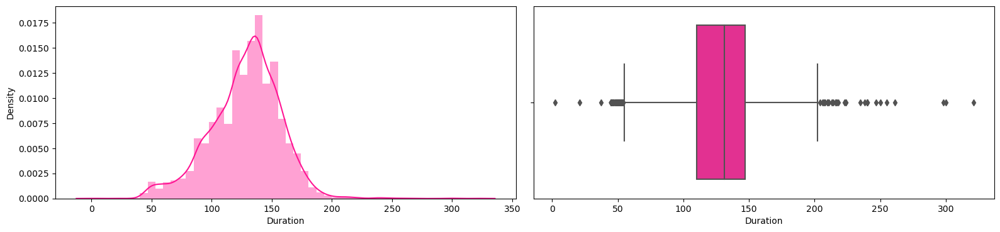

In [34]:
plt.figure(figsize=(16,7))

plt.subplot(2,2,1)
sns.distplot(d['Duration'],color='DeepPink')

plt.subplot(2,2,2)
sns.boxplot(x=d['Duration'],color='DeepPink')

plt.tight_layout()
plt.show()

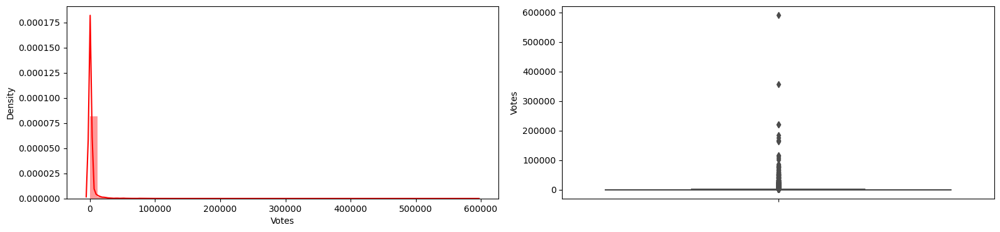

In [35]:
plt.figure(figsize=(16,7))

plt.subplot(2,2,1)
sns.distplot(d['Votes'],color='red')

plt.subplot(2,2,2)
sns.boxplot(y=d['Votes'],color='red')

plt.tight_layout()
plt.show()

### Extracting and counting the occurrences of each genre in the 'Genre' column

In [36]:
figg = px.histogram(data_frame=d, x='Genre', title='total no of Genre', color='Genre')

figg.show()

In [37]:
genresPie = d['Genre'].value_counts()
genrePie = pd.DataFrame(list(genresPie.items()))
genrePie = genrePie.rename(columns={0: 'Genre', 1: 'Count'})
genrePie.head(10)

,Genre,Count
0,Drama,2780
1,Action,1289
2,Thriller,779
3,Romance,708
4,"Drama, Romance",524
5,Comedy,495
6,"Action, Crime, Drama",455
7,"Drama, Family",418
8,Horror,322
9,"Action, Drama",316


### Movies with Rating greater than 8 and votes greater than 10000

In [38]:
# Assuming 'd' is your DataFrame
df = d.loc[(d['Rating'] > 8) & (d['Votes'] > 10000), ['Rating', 'Votes', 'Name']]

fig = px.bar(df, x='Name', y='Votes', color='Rating', title='Movies with Rating greater than 8 and votes greater than 10000',
             labels={'Votes': 'Votes', 'Name': 'Movie Name'},
             width=1000, height=600)

fig.update_layout(xaxis=dict(tickangle=65,                                      # Rotate the x-axis tick labels by 65 degrees
                             tickmode='array',                                  # Use an array for specifying tick positions
                             title= 0.5, tickvals=list(range(len(df['Name']))), # Specify the positions of the ticks
                             ticktext=df['Name']))                              # Specify the text for each tick label

fig.show()

In [39]:
df.head(5)

,Rating,Votes,Name
75,8.4,357889.0,Idiots
173,8.1,75118.0,A Wednesday
981,8.3,31937.0,Anand
1009,8.1,50810.0,Andaz Apna Apna
1019,8.2,77901.0,Andhadhun


In [40]:
df1 = d.loc[(d['Rating'] <= 5) & (d['Votes'] > 10000), ['Rating', 'Votes', 'Name']]

fig = px.bar(df1, x='Name', y='Votes', color='Rating', title='Movies with Rating smaller than equal 5 and votes greater than 10000',
             labels={'Votes': 'Votes', 'Name': 'Movie Name'},
             width=1000, height=600)

fig.update_layout(xaxis=dict(tickangle=30, tickmode='array', tickvals=list(range(len(df1['Name']))),
                             ticktext=df1['Name']))

fig.show()

In [41]:

top5_rating = d[['Year', 'Rating']].sort_values(by='Rating', ascending=False).head()

# Create a bar chart using Plotly Express
fig = px.bar(top5_rating, x='Year', y='Rating',
             color='Year', text='Rating',
             labels={'Year': 'Year', 'Rating': 'Rating'},
             title='Overall Top 5 Ratings',
             color_discrete_map={'Year': 'purple'},
            width=800, height=600)

fig.update_traces(texttemplate='%{text:.1f}', textposition='outside')

fig.update_layout(xaxis=dict(tickangle=0))

# Customize layout
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Rating",
    title_font=dict(size=20, family="Arial, sans-serif", color="RebeccaPurple"),
    font=dict(family="Arial, sans-serif", size=15, color="Black"),
    legend=dict(title=dict(text='', font=dict(size=10)))
)

fig.show()

In [42]:
top5_rating = d[['Year', 'Rating']].sort_values(by='Rating', ascending=False).head()

# Create a bar chart using Plotly.graph_objects
fig = go.Figure()

# Add bar trace
fig.add_trace(go.Bar(
    x=top5_rating['Year'],
    y=top5_rating['Rating'],
    marker=dict(color='purple')
))

# Add annotations for each bar
for index, row in top5_rating.iterrows():
    fig.add_annotation(
        x=row['Year'],
        y=row['Rating'],
        text=f'{row["Rating"]:.1f}',
        showarrow=True,
        arrowhead=4,
        arrowcolor='black',
        font=dict(size=12),
        xanchor='center',
        yanchor='bottom'
    )

# Customize layout
fig.update_layout(
    title='Overall Top 5 Ratings',
    xaxis_title='Year',
    yaxis_title='Rating',
    xaxis=dict(tickmode='array', tickvals=top5_rating['Year'], ticktext=top5_rating['Year']),
    font=dict(size=15, color='black'),
    showlegend=False
)

# Show the plot
fig.show()

In [43]:
# Define a function to create bar chart using Plotly Express to visualize the top 10 values and their counts for a specified column
def bestTenPlot(column):
    global d

    # Get the top 10 values and their counts
    top_values = d[column].value_counts().sort_values(ascending=False)[:10]

    # Create a DataFrame for Plotly Express
    data = {'Values': top_values.index, 'Count': top_values.values}
    
    # Create a bar chart using Plotly Express
    fig = px.bar(data, x='Values', y='Count', text='Count',
                 title=f'best Ten {column}',
                 labels={'Values': column, 'Count': 'Count'},
                 template='plotly_dark')

    fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')

    fig.update_layout(xaxis=dict(tickangle=55, tickmode='linear'))

    fig.show()

In [44]:
bestTenPlot('Name')

In [45]:
bestTenPlot("Director")

In [46]:
bestTenPlot("Actor 1")

In [47]:
bestTenPlot("Actor 2")

In [48]:
bestTenPlot("Actor 3")

In [49]:
bestTenPlot("Genre")

In [50]:
bestTenPlot('Votes')

In [51]:
# Sorting series by counts then selecting top 10
frequent_actor = Actors.value_counts().sort_values(ascending=False).head(10)

# Creating a DataFrame for Plotly Express
data = {'Actor': frequent_actor.index, 'Count': frequent_actor.values}
fig = px.bar(data, x='Count', y='Actor', orientation='h', color='Count',
             labels={'Count': 'Count', 'Actor': 'Actor'},
             title='Top 10 Actors', template='plotly_dark')

fig.update_layout(font=dict(family="Arial, sans-serif", size=12, color="RebeccaPurple"))

fig.show()

In [52]:
def Scatterplot(x, y, c=None):
    global d
    
    plt.figure(figsize=(20,6))
    plt.scatter(d[x], d[y], edgecolor="k", c=c)
    plt.xticks(rotation=0)
    
    plt.title("Scatter plot X:{} / Y:{}".format(x, y))
    plt.xlabel(x)
    plt.ylabel(y)
    
    plt.show() 

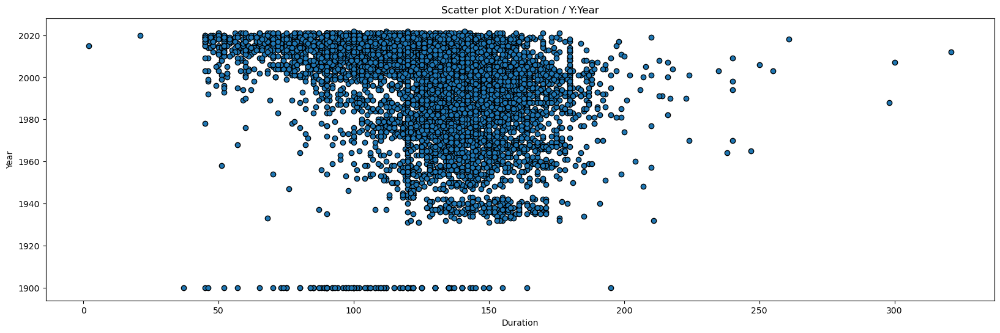

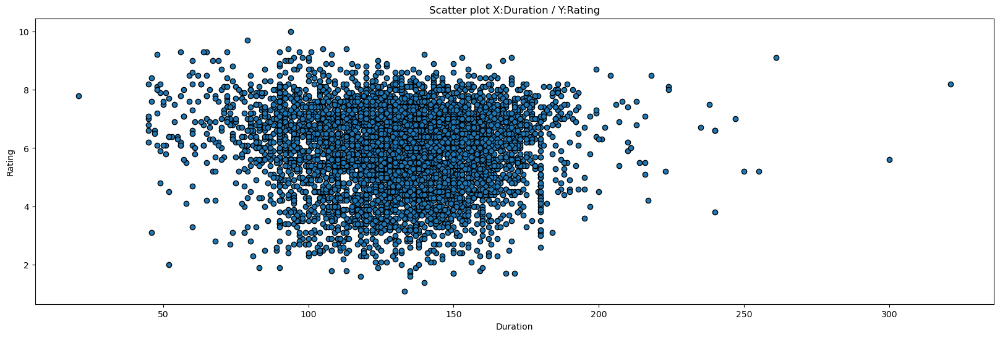

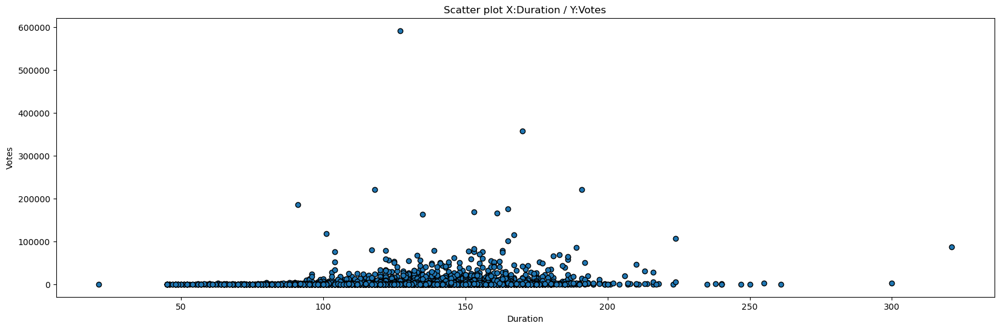

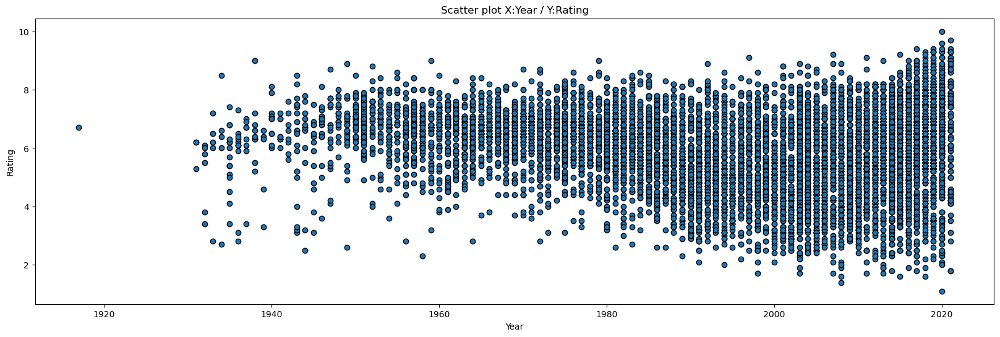

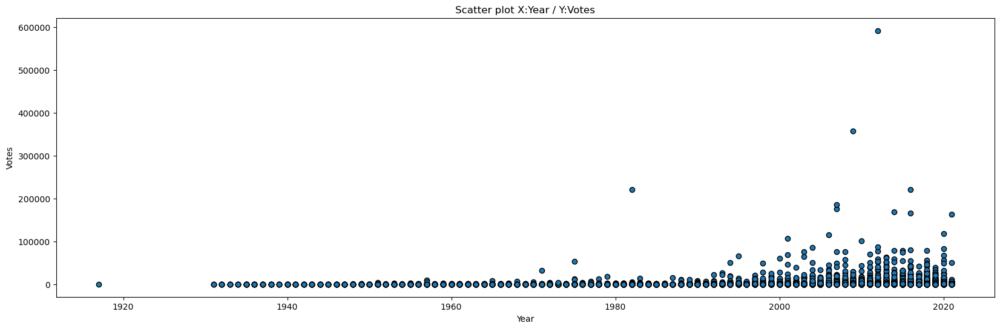

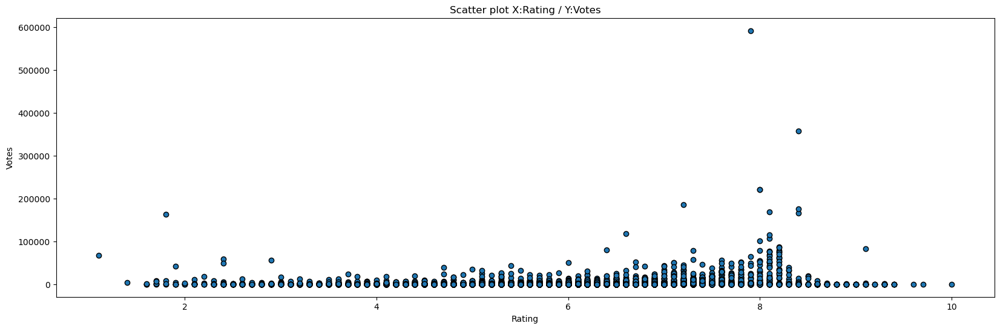

In [53]:
comb = combinations(["Duration", "Year", "Rating", "Votes"], 2)
comb_list = []
for i in list(comb):
    comb_list.append(list(i))
    
for col in comb_list:
    Scatterplot(col[0], col[1])

# <font color="purple"><b>Data preprocessing</b></font>

In [54]:
d.isnull().sum().sort_values(ascending = False) 

Duration    8269
Rating      7590
Votes       7590
Actor 3     3144
Actor 2     2384
Genre       1877
Actor 1     1617
Director     525
Name          10
Year           0
dtype: int64

In [55]:
def missing (h):
    missing_number = h.isnull().sum().sort_values(ascending=False)
    missing_percent = (h.isnull().sum()/h.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values
missing(d)

,Missing_Number,Missing_Percent
Duration,8269,0.533174
Rating,7590,0.489393
Votes,7590,0.489393
Actor 3,3144,0.202721
Actor 2,2384,0.153717
Genre,1877,0.121027
Actor 1,1617,0.104262
Director,525,0.033851
Name,10,0.000645
Year,0,0.000000


<Axes: >

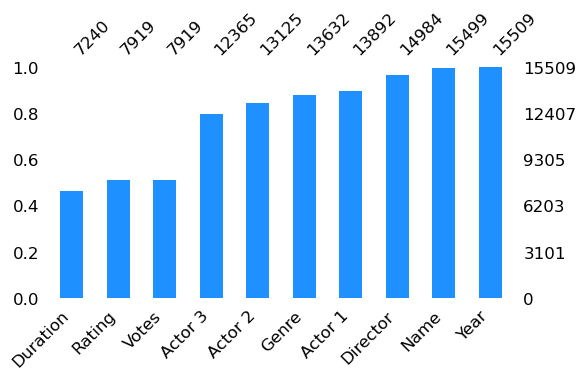

In [56]:
missingno.bar(d, color="dodgerblue", sort="ascending", figsize=(6,3), fontsize=12)

In [57]:
d.dropna(subset=['Rating','Director', 'Actor 1', 'Actor 2', 'Actor 3', 'Genre'], inplace=True)
d['Duration'].fillna(d['Duration'].mean(), inplace=True)

In [58]:
d.isnull().sum().sort_values(ascending = False) 

Name        9
Year        0
Duration    0
Genre       0
Rating      0
Votes       0
Director    0
Actor 1     0
Actor 2     0
Actor 3     0
dtype: int64

<Axes: >

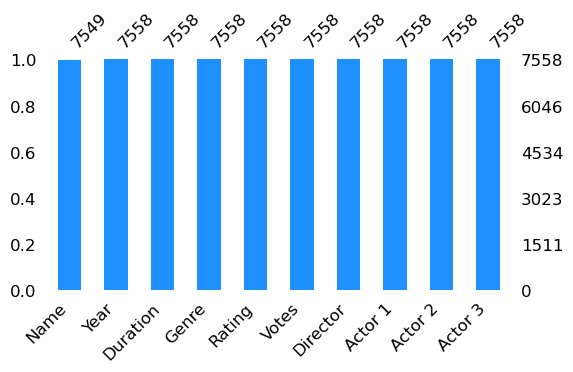

In [59]:
missingno.bar(d, color="dodgerblue", sort="ascending", figsize=(6,3), fontsize=12)

# <font color="purple"><b>Feature Engineering</b></font>

In [60]:
d['Genre'] = d['Genre'].str.split(', ')
d = d.explode('Genre')
d['Genre'].fillna(d['Genre'].mode()[0], inplace=True)

In [61]:
d.head(3)

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
1,Gadhvi,2019,109.0,Drama,7.0,8.0,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
3,Yaaram,2019,110.0,Comedy,4.4,35.0,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
3,Yaaram,2019,110.0,Romance,4.4,35.0,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor


In [62]:
actor1_encoding = d.groupby('Actor 1').agg({'Rating': 'mean'}).to_dict()
actor2_encoding = d.groupby('Actor 2').agg({'Rating': 'mean'}).to_dict()
actor3_encoding = d.groupby('Actor 3').agg({'Rating': 'mean'}).to_dict()
director_encoding = d.groupby('Director').agg({'Rating': 'mean'}).to_dict()
genre_encoding = d.groupby('Genre').agg({'Rating': 'mean'}).to_dict()

In [63]:
d['actor1_encoded'] = round(d['Actor 1'].map(actor1_encoding['Rating']), 1)
d['actor2_encoded'] = round(d['Actor 2'].map(actor2_encoding['Rating']), 1)
d['actor3_encoded'] = round(d['Actor 3'].map(actor3_encoding['Rating']), 1)
d['director_encoded'] = round(d['Director'].map(director_encoding['Rating']), 1)
d['genre_encoded'] = round(d['Genre'].map(genre_encoding['Rating']), 1)

In [64]:
d.drop(['Name','Actor 1', 'Actor 2', 'Actor 3', 'Director', 'Genre'], axis=1, inplace=True)

In [65]:
d.head(3)

,Year,Duration,Rating,Votes,actor1_encoded,actor2_encoded,actor3_encoded,director_encoded,genre_encoded
1,2019,109.0,7.0,8.0,6.8,7.0,7.0,7.0,6.0
3,2019,110.0,4.4,35.0,5.2,4.4,4.5,4.4,5.7
3,2019,110.0,4.4,35.0,5.2,4.4,4.5,4.4,5.7


In [66]:
# Plotting the top 5 actors, director, and genre
fig = go.Figure()
# Plotting top 5 actors
for actor_column in ['actor1_encoded', 'actor2_encoded', 'actor3_encoded']:
    top5_actors = d[['Year', actor_column]].sort_values(by=actor_column, ascending=False).head()
    fig.add_trace(go.Bar(x=top5_actors['Year'], y=top5_actors[actor_column],
                         name=actor_column, marker_color='purple'))

# Plotting director
top_director = d[['Year', 'director_encoded']].sort_values(by='director_encoded', ascending=False).head()
fig.add_trace(go.Bar(x=top_director['Year'], y=top_director['director_encoded'],
                     name='director_encoded', marker_color='orange'))

# Plotting genre
top_genre = d[['Year', 'genre_encoded']].sort_values(by='genre_encoded', ascending=False).head()
fig.add_trace(go.Bar(x=top_genre['Year'], y=top_genre['genre_encoded'],
                     name='genre_encoded', marker_color='green'))

# Customize layout
fig.update_layout(
    xaxis=dict(title='Year'),
    yaxis=dict(title='Encoded Rating'),
    title=dict(text='Top 5 Actors, Director, and Genre', font=dict(size=20)),
    font=dict(family="Arial, sans-serif", size=15, color="Black"),
    barmode='group'
)
fig.show()

<Axes: >

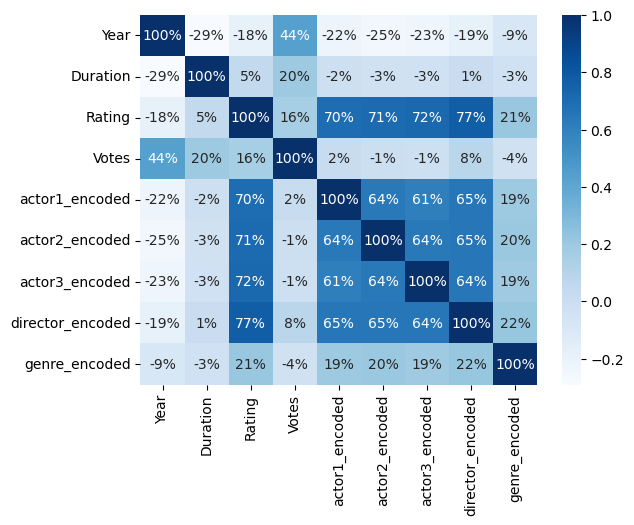

In [67]:
sns.heatmap(d.corr(method='spearman'),annot=True,cmap="Blues", fmt='.0%')

# <font color="purple"><b>Data Splitting</b></font>

In [68]:
X = d.drop(['Rating'], axis=1)
y = d['Rating']

In [69]:
#Splitting train and test set
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.1,random_state= 22)  

# <font color="purple"><b>Model Fitting</b></font>

## <font color="red"><b>Linear Regression</b></font>

In [70]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr_pred_train = lr.predict(X_train)
lr_pred_test = lr.predict(X_test)

print('Mean Squared Error (Linear Regression - Test):',   mean_squared_error(y_test, lr_pred_test))
print('Mean Absolute Error  (Linear Regression - Test): ',mean_absolute_error(y_test, lr_pred_test))
print('R2 score (Linear Regression - Train): ',           r2_score(y_train,lr_pred_train))
print('R2 Score (Linear Regression - Test):',             r2_score(y_test,lr_pred_test))

Mean Squared Error (Linear Regression - Test): 0.4643921461975544
Mean Absolute Error  (Linear Regression - Test):  0.5078404379088715
R2 score (Linear Regression - Train):  0.7504478189374881
R2 Score (Linear Regression - Test): 0.7386906025015397


## <font color="red"><b>Random forest Regressor</b></font>

In [71]:
rfg = RandomForestRegressor()
rfg.fit(X_train,y_train)
rf_pred_train = rfg.predict(X_train)
rf_pred_test = rfg.predict(X_test)

print('Mean Squared Error (Random Forest - Test):',mean_squared_error(y_test, rf_pred_test))
print('Mean Absolute Error  (Random Forest - Test): ',mean_absolute_error(y_test, rf_pred_test))
print('R2 score (Random Forest - Train): ',r2_score(y_train,rf_pred_train))
print('R2 Score (Random Forest - Test):',r2_score(y_test,rf_pred_test))

Mean Squared Error (Random Forest - Test): 0.08808601625487646
Mean Absolute Error  (Random Forest - Test):  0.17392392717815375
R2 score (Random Forest - Train):  0.9910290466482781
R2 Score (Random Forest - Test): 0.9504347693558765


## <font color="red"><b>Xgboost Regressor</b></font>

In [72]:
# Create and train the XGBoost Regressor model
xgboost = XGBRegressor(objective='reg:squarederror', random_state=42)
xgboost.fit(X_train, y_train)
y_pred_xgboost_train = xgboost.predict(X_train)
y_pred_xgboost_test = xgboost.predict(X_test)

print('Mean Squared Error (xgboost - Test):', mean_squared_error(y_test, y_pred_xgboost_test))
print('Mean Absolute Error  (xgboost - Test): ',mean_absolute_error(y_test, y_pred_xgboost_test))
print('R2 score (xgboost - Train): ', r2_score(y_train, y_pred_xgboost_train))
print('R2 Score (xgboost - Test):', r2_score(y_test,y_pred_xgboost_test))

Mean Squared Error (xgboost - Test): 0.19402499513352767
Mean Absolute Error  (xgboost - Test):  0.30208498881294144
R2 score (xgboost - Train):  0.9484468140076008
R2 Score (xgboost - Test): 0.8908238328466141


## <font color="red"><b>Decision Tree</b></font>

In [73]:
dt = DecisionTreeRegressor(max_depth=9,random_state=42)
dt.fit(X_train,y_train)
y_pred_dt_train = dt.predict(X_train)
y_pred_dt_test = dt.predict(X_test)

print('Mean Squared Error (Decision Tree - Test):',mean_squared_error(y_test, y_pred_dt_test))
print('Mean Absolute Error  (Decision Tree - Test): ',mean_absolute_error(y_test, y_pred_dt_test))
print('R2 score (Decision Tree - Train): ',r2_score(y_train,y_pred_dt_train))
print('R2 Score (Decision Tree - Test):',r2_score(y_test,y_pred_dt_test))

Mean Squared Error (Decision Tree - Test): 0.3832810391265005
Mean Absolute Error  (Decision Tree - Test):  0.42638652903511415
R2 score (Decision Tree - Train):  0.83019589638655
R2 Score (Decision Tree - Test): 0.784331112774411


## <font color="red"><b>CatBoost Regressor</b></font>

In [74]:
cbr = CatBoostRegressor(n_estimators=100, random_state=1, verbose=False)
cbr.fit(X_train,y_train)
y_pred_cbr_train = cbr.predict(X_train)
y_pred_cbr_test = cbr.predict(X_test)

print('Mean Squared Error (CatBoost - Test):',mean_squared_error(y_test, y_pred_cbr_test))
print('Mean Absolute Error  (CatBoost - Test): ',mean_absolute_error(y_test, y_pred_cbr_test))
print('R2 score (CatBoost - Train): ',r2_score(y_train,y_pred_cbr_train))
print('R2 Score (CatBoost - Test):',r2_score(y_test,y_pred_cbr_test))

Mean Squared Error (CatBoost - Test): 0.267055200361255
Mean Absolute Error  (CatBoost - Test):  0.37323368972013776
R2 score (CatBoost - Train):  0.8826771274572397
R2 Score (CatBoost - Test): 0.849730375337692


## <font color="red"><b>Gradient Boosting Regressor</b></font>

In [75]:
gbr = GradientBoostingRegressor(n_estimators=100, random_state=60)
gbr.fit(X_train, y_train)
y_pred_gbr_train = gbr.predict(X_train)
y_pred_gbr_test = gbr.predict(X_test)

print('Mean Squared Error (Gradient Boost - Test):', mean_squared_error(y_test, y_pred_gbr_test))
print('Mean Absolute Error  (Gradient Boost - Test): ',mean_absolute_error(y_test, y_pred_gbr_test))
print('R2 score (Gradient Boost - Train): ', r2_score(y_train, y_pred_gbr_train))
print('R2 Score (Gradient Boost - Test):', r2_score(y_test,y_pred_gbr_test))

Mean Squared Error (Gradient Boost - Test): 0.35217895973227953
Mean Absolute Error  (Gradient Boost - Test):  0.43188080640342574
R2 score (Gradient Boost - Train):  0.8213994130387381
R2 Score (Gradient Boost - Test): 0.8018319807240506


## <font color="red"><b>Light Gradient Boosting Machine Regressor</b></font>

In [76]:
lgbmr = LGBMRegressor(n_estimators=100, random_state=60, force_col_wise=True)
lgbmr.fit(X_train, y_train)
y_pred_lgbmr_train = lgbmr.predict(X_train)
y_pred_lgbmr_test = lgbmr.predict(X_test)

print('Mean Squared Error (LGBM - Test):', mean_squared_error(y_test, y_pred_lgbmr_test))
print('Mean Absolute Error  (LGBM - Test): ',mean_absolute_error(y_test, y_pred_lgbmr_test))
print('R2 score (LGBM - Train): ', r2_score(y_train, y_pred_lgbmr_train))
print('R2 Score (LGBM - Test):', r2_score(y_test,y_pred_lgbmr_test))

[LightGBM] [Info] Total Bins 829
[LightGBM] [Info] Number of data points in the train set: 13842, number of used features: 8
[LightGBM] [Info] Start training from score 5.800903
Mean Squared Error (LGBM - Test): 0.2647552519456914
Mean Absolute Error  (LGBM - Test):  0.3656847437709788
R2 score (LGBM - Train):  0.8865253960625514
R2 Score (LGBM - Test): 0.8510245361878904


# <font color="purple"><b>Prediction & Visualize Evaluation</b></font>

In [77]:
# Evaluate Linear Regression
mae_lr_train = mean_absolute_error(y_train, lr_pred_train)
mae_lr_test = mean_absolute_error(y_test, lr_pred_test)
mse_lr_train = mean_squared_error(y_train, lr_pred_train)
mse_lr_test = mean_squared_error(y_test, lr_pred_test)

# Evaluate Random Forest Regressor
mae_rf_train = mean_absolute_error(y_train, rf_pred_train)
mae_rf_test = mean_absolute_error(y_test, rf_pred_test)
mse_rf_train = mean_squared_error(y_train, rf_pred_train)
mse_rf_test = mean_squared_error(y_test, rf_pred_test)

# Evaluate Decision Tree Regressor
mae_dt_train = mean_absolute_error(y_train, y_pred_dt_train)
mae_dt_test = mean_absolute_error(y_test, y_pred_dt_test)
mse_dt_train = mean_squared_error(y_train, y_pred_dt_train)
mse_dt_test = mean_squared_error(y_test, y_pred_dt_test)

# Evaluate xgboost Regressor
mae_xg_train = mean_absolute_error(y_train, y_pred_xgboost_train)
mae_xg_test = mean_absolute_error(y_test, y_pred_xgboost_test)
mse_xg_train = mean_squared_error(y_train, y_pred_xgboost_train)
mse_xg_test = mean_squared_error(y_test, y_pred_xgboost_test)

# Evaluate CatBoost Regressor
cbr_xg_train = mean_absolute_error(y_train, y_pred_cbr_train)
cbr_xg_test = mean_absolute_error(y_test, y_pred_cbr_test)
cbr_xg_train = mean_squared_error(y_train, y_pred_cbr_train)
cbr_xg_test = mean_squared_error(y_test, y_pred_cbr_test)

# Evaluate Gradient Boosting Regressor
gbr_xg_train = mean_absolute_error(y_train, y_pred_gbr_train)
gbr_xg_test = mean_absolute_error(y_test, y_pred_gbr_test)
gbr_xg_train = mean_squared_error(y_train, y_pred_gbr_train)
gbr_xg_test = mean_squared_error(y_test, y_pred_gbr_test)

# Evaluate Light Gradient Boosting Machine Regressor
lgbmr_xg_train = mean_absolute_error(y_train, y_pred_lgbmr_train)
lgbmr_xg_test = mean_absolute_error(y_test, y_pred_lgbmr_test)
lgbmr_xg_train = mean_squared_error(y_train, y_pred_lgbmr_train)
lgbmr_xg_test = mean_squared_error(y_test, y_pred_lgbmr_test)

In [78]:
# Create DataFrames for plotting
metrics_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest Regressor', 'decision tree','xgboost Regressor', 'CatBoost Regressor', 'Gradient Boost Regressor', 'Light Gradient Boost Machine Regressor'],
    'MAE Train': [mae_lr_train, mae_rf_train,mae_dt_train,mae_xg_train,cbr_xg_train,gbr_xg_train,lgbmr_xg_train],
    'MAE Test': [mae_lr_test, mae_rf_test, mae_dt_test,mae_xg_test,cbr_xg_test,gbr_xg_test,lgbmr_xg_test],
    'MSE Train': [mse_lr_train, mse_rf_train, mse_dt_train,mse_xg_train,cbr_xg_train,gbr_xg_train,lgbmr_xg_train],
    'MSE Test': [mse_lr_test, mse_rf_test, mse_dt_test,mse_xg_test,cbr_xg_test,gbr_xg_test,lgbmr_xg_test]
})

In [79]:
# Plotting MAE
fig_mae = px.bar(metrics_df, x='Model', y=['MAE Train', 'MAE Test'],
                 title='Mean Absolute Error (MAE)',
                 labels={'value': 'MAE', 'variable': 'Dataset'},
                 color_discrete_map={'MAE Train': 'blue', 'MAE Test': 'red'})
fig_mae.update_layout(barmode='group')

# Show the plots
fig_mae.show()


In [80]:
# Plotting MSE
fig_mse = px.bar(metrics_df, x='Model', y=['MSE Train', 'MSE Test'],
                 title='Mean Squared Error (MSE)',
                 labels={'value': 'MSE', 'variable': 'Dataset'},
                 color_discrete_map={'MSE Train': 'blue', 'MSE Test': 'red'})
fig_mse.update_layout(barmode='group')

fig_mse.show()

In [92]:
scatter_color = 'skyblue'
plot_width = 800
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_xgboost_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training xgboost Regressor Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_xgboost_test, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing xgboost Regressor Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

In [83]:
scatter_color = 'skyblue'
plot_width = 800
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_cbr_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training CatBoost Regressor Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_cbr_test, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing CatBoost Regressor Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

In [84]:
scatter_color = 'skyblue'
plot_width = 800
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_gbr_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training Gradient Boost Regressor Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_gbr_test, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing Gradient Boost Regressor Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

In [85]:
scatter_color = 'skyblue'
plot_width = 800
plot_height = 275

# Scatter plot for Training Set
fig_train = px.scatter(x=y_train, y=y_pred_lgbmr_train, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                       title='Evaluation of Training Light Gradient Boost Machine Regressor Model', trendline='ols',
                       color_discrete_sequence=[scatter_color])
fig_train.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Scatter plot for Testing Set
fig_test = px.scatter(x=y_test, y=y_pred_lgbmr_test, labels={'x': 'Actual Ratings', 'y': 'Predicted Ratings'},
                      title='Evaluation of Testing Light Gradient Boost Machine Regressor Model', trendline='ols',
                      color_discrete_sequence=[scatter_color])
fig_test.update_layout(showlegend=True, width=plot_width, height=plot_height)

# Show the plots
fig_train.show()
fig_test.show()

In [86]:
# Create a prediction dataframe by Random Forest Regressor Model
prediction_Random_Forest_Regressor  = pd.DataFrame({'actual_rating': y_test,
                        'predicted_rating': rf_pred_test.ravel(),
                        'residual': y_test - rf_pred_test}
                      )
prediction_Random_Forest_Regressor.head(10)

,actual_rating,predicted_rating,residual
9475,7.0,6.892,0.108
12851,6.1,6.509,-0.409
10801,6.8,6.526,0.274
5268,2.4,2.513,-0.113
7527,5.7,5.761,-0.061
8057,6.3,6.310,-0.010
13436,6.3,6.330,-0.030
10518,5.4,5.241,0.159
3429,5.6,5.456,0.144
6843,6.1,6.276,-0.176


In [87]:
def evaluate_model(y_true, y_pred, model_name):
    print("Model: ", model_name)
    print("Accuracy = {:0.2f}%".format(r2_score(y_true, y_pred)*100))
    print("Mean Squared Error = {:0.2f}\n".format(mean_squared_error(y_true, y_pred, squared=False)))
    return round(r2_score(y_true, y_pred)*100, 2)

In [88]:
LRScore = evaluate_model(y_test, lr_pred_test, "LINEAR REGRESSION")
RFScore = evaluate_model(y_test, rf_pred_test, "RANDOM FOREST")
DTScore = evaluate_model(y_test, y_pred_dt_test, "DECEISION TREE")
XGBScore = evaluate_model(y_test, y_pred_xgboost_test, "EXTENDED GRADIENT BOOSTING")
GBScore = evaluate_model(y_test, y_pred_gbr_test, "GRADIENT BOOSTING")
LGBScore = evaluate_model(y_test, y_pred_lgbmr_test, "LIGHT GRADIENT BOOSTING")
CBRScore = evaluate_model(y_test, y_pred_cbr_test, "CAT BOOST")

Model:  LINEAR REGRESSION
Accuracy = 73.87%
Mean Squared Error = 0.68

Model:  RANDOM FOREST
Accuracy = 95.04%
Mean Squared Error = 0.30

Model:  DECEISION TREE
Accuracy = 78.43%
Mean Squared Error = 0.62

Model:  EXTENDED GRADIENT BOOSTING
Accuracy = 89.08%
Mean Squared Error = 0.44

Model:  GRADIENT BOOSTING
Accuracy = 80.18%
Mean Squared Error = 0.59

Model:  LIGHT GRADIENT BOOSTING
Accuracy = 85.10%
Mean Squared Error = 0.51

Model:  CAT BOOST
Accuracy = 84.97%
Mean Squared Error = 0.52



In [89]:
models = pd.DataFrame(
    {
        "MODELS": ["Linear Regression", "Random Forest", "Decision Tree", "Gradient Boosting", "Extended Gradient Boosting", "Light Gradient Boosting", "Cat Boosting"],
        "SCORES": [LRScore, RFScore, DTScore, GBScore, XGBScore, LGBScore, CBRScore]
    }
)
models.sort_values(by='SCORES', ascending=False)

,MODELS,SCORES
1,Random Forest,95.04
4,Extended Gradient Boosting,89.08
5,Light Gradient Boosting,85.10
6,Cat Boosting,84.97
3,Gradient Boosting,80.18
2,Decision Tree,78.43
0,Linear Regression,73.87
